In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import normflows as nf
import matplotlib.pyplot as plt
import torch
import numpy as np
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
from fab import FABModel, HamiltonianMonteCarlo, Metropolis
from fab.utils.logging import ListLogger
from fab.utils.plotting import plot_history, plot_contours, plot_marginal_pair
from fab.target_distributions.gmm import GMM
from fab.utils.prioritised_replay_buffer import SimpleBuffer
from torch.autograd import grad
from fab.utils.plotting import plot_contours, plot_marginal_pair
from experiments.make_flow import make_wrapped_normflow_realnvp
import models.ddpm
import models.mlp
import pdb
from tqdm import tqdm
from models.ddpm import GaussianDiffusion, TMLP
from models.mlp import MyMLP, MyMLP2
from math import sqrt

import torch
import torchsde

from functorch import vmap

from torchdiffeq import odeint

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [5]:
normalize_data = True
if normalize_data:
    global_mins, global_maxs = -50, 50
else:
    global_mins, global_maxs = -1, 1 

### Target Distribution

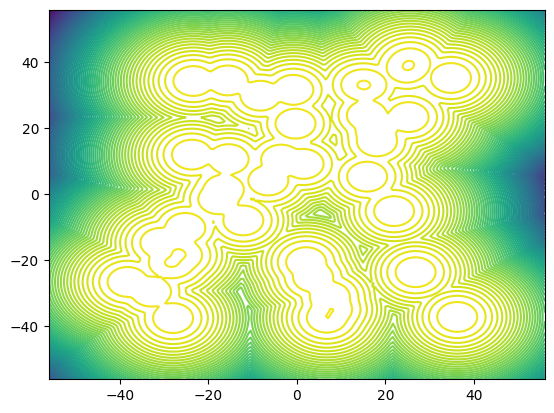

In [6]:
dim = 2
n_mixes = 40
loc_scaling = 40.0  # scale of the problem (changes how far apart the modes of each Guassian component will be)
log_var_scaling = 1.0 # variance of each Gaussian
seed = 0

if device == "cpu":
    use_gpu = False
else:
    use_gpu = True
torch.manual_seed(0)  # seed of 0 for GMM problem
target = GMM(dim=dim, n_mixes=n_mixes,
              loc_scaling=loc_scaling, log_var_scaling=log_var_scaling,
              use_gpu=use_gpu, true_expectation_estimation_n_samples=int(1e5))
# plot target
target.to("cpu")
fig, ax = plt.subplots()
plotting_bounds = (-loc_scaling * 1.4, loc_scaling * 1.4)
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=80, ax=ax, grid_width_n_points=200)
target.to(device)

### Helper Functions

In [7]:
def plot_dataset(samples, gen_samples=None):
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    target.to("cpu")
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[0], n_contour_levels=50, grid_width_n_points=200)

    # plot dataset samples
    plot_marginal_pair(samples, ax=axs[0], bounds=plotting_bounds)
    axs[0].set_title("Buffer")

    if gen_samples is not None:
        plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[1], n_contour_levels=50, grid_width_n_points=200)
        # plot generated samples
        plot_marginal_pair(gen_samples, ax=axs[1], bounds=plotting_bounds)
        axs[1].set_title("Generated samples")
    else:
        #delete subplot
        fig.delaxes(axs[1])
        
    target.to(device)
    plt.show()
    return [fig]

In [8]:
def clip(f, max_norm):
    norm = torch.linalg.vector_norm(f, dim=-1)
    clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
    f = f * clip_coef.unsqueeze(-1)
    return f

In [9]:
def normalize(x):
    '''
        normalizes to [-1, 1]
    '''

    if normalize_data:
        mins = -50
        maxs = 50 
        ## [ 0, 1 ]
        x = (x - mins) / (maxs - mins + 1e-5)
        ## [ -1, 1 ]
        x = x * 2 - 1
        
        return x
    else:
        return x

def unnormalize(x, mins, maxs):
    '''
        x : [ -1, 1 ]
    '''
    # assert x.max() <= 1 and x.min() >= -1, f'x range: ({x.min():.4f}, {x.max():.4f})'
    #x = x * std + mean

    if normalize_data:
        x = (x + 1) / 2
        x = x * (maxs - mins) + mins
        return x
    else:
        return x

In [10]:
from abc import ABC, abstractmethod

class NoiseSchedule(ABC):
    @abstractmethod
    def g(t):
        # Returns g(t)
        pass
    
    @abstractmethod
    def h(t):
        # Returns \int_0^t g(t)^2 dt
        pass

    
class LinearNoiseSchedule(NoiseSchedule):
    def __init__(self, beta, norm_factor=1.0):
        self.beta = beta / norm_factor
        
    def g(self, t):
        return self.beta.sqrt()
        # return torch.sqrt(self.beta * 2 * t)
    
    def h(self, t):
        return self.beta * t #**2

class GeometricNoiseSchedule(NoiseSchedule):
    def __init__(self, sigma_min, sigma_max, norm_factor=1.0):
        self.sigma_min = sigma_min / norm_factor
        self.sigma_max = sigma_max / norm_factor
        self.sigma_diff = self.sigma_max / self.sigma_min
        
    def g(self, t):
        # Let sigma_d = sigma_max / sigma_min
        # Then g(t) = sigma_min * sigma_d^t * sqrt{2 * log(sigma_d)}
        # See Eq 192 in https://arxiv.org/pdf/2206.00364.pdf
        return self.sigma_min * (self.sigma_diff ** t) * ((2 * np.log(self.sigma_diff)) ** 0.5)
        
    def h(self, t):
        # Let sigma_d = sigma_max / sigma_min
        # Then h(t) = \int_0^t g(z)^2 dz = sigma_min * sqrt{sigma_d^{2t} - 1}
        # see Eq 199 in https://arxiv.org/pdf/2206.00364.pdf
        return (self.sigma_min * (((self.sigma_diff ** (2 * t)) - 1) ** 0.5)) ** 2

## Function Definitions

### Estimated Reward Functions

In [11]:
# calculate the log expectation of the reward
def log_E_R(_x, _t, noise_schedule, num_mc_samples, var_exploding=True):
    repeated_x = _x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = _t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    h_t  = noise_schedule.h(repeated_t) 
    h_t = h_t.unsqueeze(1)
    if var_exploding:
        # variance exploding
        samples = repeated_x + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
        log_rewards = target.log_prob(unnormalize(samples, global_mins, global_maxs))
        log_expectation_R = torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    else:
        # variance preserving
        samples = (repeated_x/torch.sqrt(1 - repeated_t.unsqueeze(1)) 
                   + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5))
        log_rewards = target.log_prob(unnormalize(samples, global_mins, global_maxs))
        log_expectation_R = torch.log(1 / (1 - _t)) + torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    return log_expectation_R

In [12]:
def estimated_Rt(x, t, noise_schedule, num_mc_samples=100, var_exploding=True):
    if t.dim() == 0:
        # repeat the same time for all points if we have a scalar time
        t = t * torch.ones(x.shape[0]).to(device)
    return torch.vmap(log_E_R, 
                      randomness='different', in_dims=(0,0,None,None))(x, t, noise_schedule, 
                                                                       num_mc_samples, var_exploding=var_exploding)

In [13]:
# def estimate_grad_Rt(x, t, beta, num_mc_samples=200, var_exploding=True, richardson=False):
#     est_scores_n = torch.vmap(torch.func.grad(log_E_R), 
#                             in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples, 
#                                                                                   var_exploding=var_exploding)
#     if richardson:
#         est_scores_n_div2 = torch.vmap(torch.func.grad(log_E_R), 
#                                    in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples//2, 
#                                                                                          var_exploding=var_exploding)
#         return (2*est_scores_n - est_scores_n_div2)
#     else:
#         return est_scores_n

In [14]:
def estimate_grad_Rt(x, t, noise_schedule, num_mc_samples=100, var_exploding=True, richardson=False):

    est_scores_n = torch.func.grad(log_E_R)(x, t, noise_schedule, num_mc_samples, var_exploding=var_exploding)
    if richardson:
        est_scores_n_div2 = torch.func.grad(log_E_R)(x, t, noise_schedule, num_mc_samples//2, 
                                                                                         var_exploding=var_exploding)
        return (2*est_scores_n - est_scores_n_div2)
    else:
        return est_scores_n

### True Reward Functions

In [15]:
def true_Rt(target, x, t, noise_schedule):
    h_t = noise_schedule.h(t).to(device) #[0]
    target.convolve(h_t * (target.data_normalization_factor **2), t)
    energy = target(x)
    target.reset()
    return energy

In [16]:
def true_grad_Rt(x, t, noise_schedule, var_exploding=True):
    samples_energy = true_Rt(x, t, noise_schedule, var_exploding=var_exploding)
    true_scores = torch.autograd.grad(samples_energy.sum(), x, create_graph=True)[0] #.detach()
    return true_scores

## SDE Tests

### Dataset

In [17]:
# hyper-parameters

# Flow
n_flow_layers = 15
layer_nodes_per_dim = 40
lr = 1e-4
max_gradient_norm = 100.0
batch_size = 128
n_iterations = 4000
n_eval = 10
eval_batch_size = batch_size * 10
n_plots = 10 # number of plots shows throughout tranining
use_64_bit = True
alpha = 2.0
num_samples = 10000

flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)

/home/mila/t/tara.akhoundsadegh/.conda/envs/actinfenv/lib/python3.10/site-packages/torch/_tensor.py:738: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:1992.)
  LU, pivots, infos = torch._lu_with_info(


In [18]:
# normalize the dataset
init_num_samples = 2048
unnorm_true_samples = target.sample(torch.tensor(init_num_samples).unsqueeze(0)).to(device).detach()
unnorm_init_samples = flow.sample((init_num_samples,)).to(device).detach()
init_energy = target.log_prob(unnorm_init_samples).detach()
init_samples =  normalize(unnorm_init_samples)

init_dataset = TensorDataset(init_samples, init_energy)
init_loader = DataLoader(init_dataset, batch_size = 512, shuffle=True) 

In [19]:
true_samples = normalize(unnorm_true_samples)
true_energy = target.log_prob(unnorm_true_samples).detach()

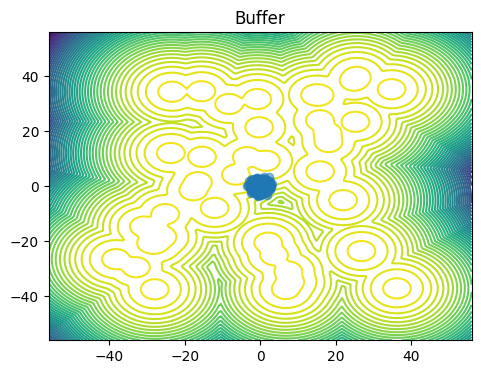

In [20]:
plot_dataset(unnorm_init_samples) # visualise the initial samples
plt.show()

### VE SDE

In [21]:
class VEReverseSDE(torch.nn.Module):
    noise_type = 'diagonal'
    sde_type = 'ito'
    
    def __init__(self, score, noise_schedule):
        super().__init__()
        self.score = score
        self.noise_schedule = noise_schedule
    
    def f(self, t, x):
        with torch.enable_grad():
            if t.dim() == 0:
                # repeat the same time for all points if we have a scalar time
                t = t * torch.ones(x.shape[0]).to(device)
                
            x.requires_grad = True
            score = self.score(x, 1-t, self.noise_schedule)
            # score = torch.vmap(self.score, randomness="different", in_dims=(0,0,None))(x, 1-t, self.noise_schedule)
        return self.g(t)**2 * score 
    
    def g(self, t):
        return self.noise_schedule.g(t.unsqueeze(1))
        # return torch.full_like(x, self.beta ** 0.5)

In [22]:
def generate_samples(ve_reverse_sde, x_init):
    t = torch.linspace(0.001, 1.0, 500).to(device)
    with torch.no_grad():
        samples = torchsde.sdeint(ve_reverse_sde, x_init, t)
    return samples

In [24]:
def euler_maruyama_step(sde, x, t, dt):
    # Calculate drift and diffusion terms
    drift = sde.f(t, x) * dt

    if t.dim() == 0:
        # repeat the same time for all points if we have a scalar time
        t = t * torch.ones(x.shape[0]).to(device)
    diffusion = sde.g(t) * np.sqrt(dt) * torch.randn_like(x).to(device)

    # Update the state
    x_next = x + drift + diffusion
    return x_next, drift

def integrate_sde(sde, x0, t_span, dt):
    times = torch.arange(t_span[0], t_span[1], dt).to(device)
    x = x0
    x0.requires_grad = True
    pred_v = []
    true_v = []
    samples = []
    with torch.no_grad():
        for t in times:
            x, f = euler_maruyama_step(sde, x, t, dt)
            samples.append(x)
            pred_v.append(f)
    return torch.stack(samples), torch.stack(pred_v)

### SDE Tests

In [37]:
num_samples = 512
if normalize_data:
    beta = torch.tensor(0.2)
else:
    beta = torch.tensor(1000)

with torch.no_grad():
    if normalize_data:
        target.convolve(torch.tensor(beta*50**2, device=torch.device('cpu')), 1)
    else:
        target.convolve(torch.tensor(beta, device=torch.device('cpu')), 1)
    x1_samples = target.sample((num_samples,))
    target.reset()
    x1_samples_normalized = normalize(x1_samples)

/tmp/ipykernel_19154/2462176889.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target.convolve(torch.tensor(beta*50**2, device=torch.device('cpu')), 1)


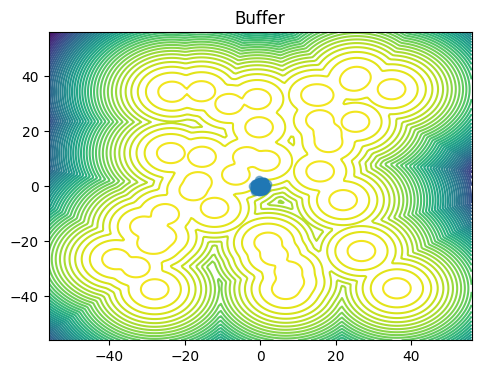

[<Figure size 1200x400 with 1 Axes>]

In [24]:
plot_dataset(x1_samples_normalized)

In [ ]:
# ve_reverse_sde = VEReverseSDE(true_grad_Rt, beta)
noise_schedule = LinearNoiseSchedule(beta)
ve_reverse_sde = VEReverseSDE(estimate_grad_Rt, noise_schedule)
# samples = generate_samples(ve_reverse_sde, x1_samples_normalized)
samples, pred_vectors = integrate_sde(ve_reverse_sde, x1_samples_normalized, [0, 1], 0.001) #true_vectors

In [ ]:
noise_schedule.g(torch.arange(0, 1, 0.001))

tensor(31.6228)

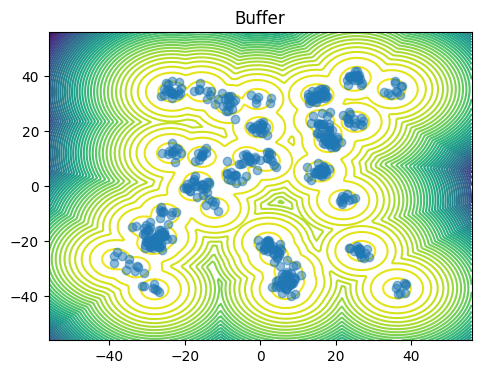

[<Figure size 1200x400 with 1 Axes>]

In [ ]:
plot_dataset(unnormalize(samples[-1], global_mins, global_maxs))

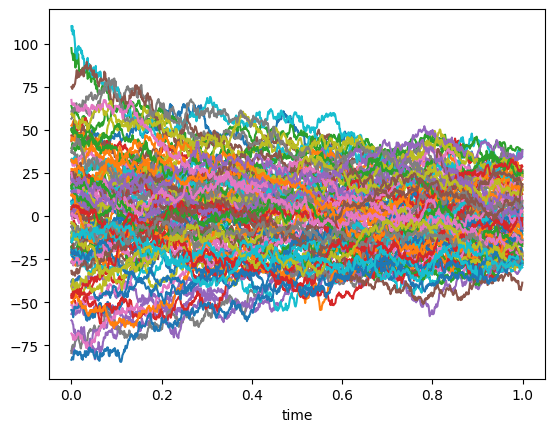

In [ ]:
plt.plot(torch.arange(0, 1, 0.001), samples[:, :100, 0].detach().cpu())
plt.xlabel("time")
plt.show()

In [ ]:
ve_reverse_sde = VEReverseSDE(true_grad_Rt, noise_schedule)
true_samples, true_vectors = integrate_sde(ve_reverse_sde, x1_samples_normalized, [0, 1], 0.001) #true_vectors

<function matplotlib.pyplot.show(close=None, block=None)>

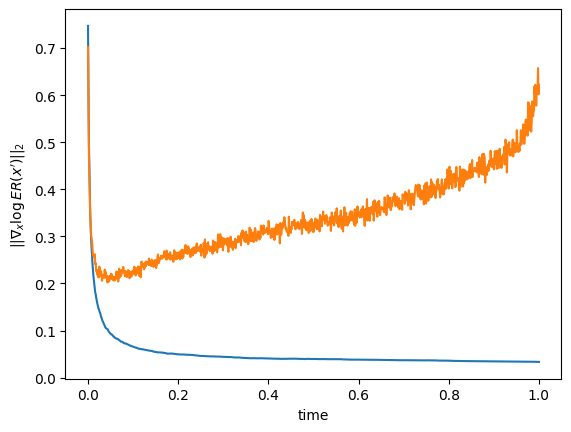

In [57]:
plt.plot(torch.linspace(1, 0, 1000), torch.linalg.norm(true_vectors, dim=-1).cpu().mean(1))
plt.plot(torch.linspace(1, 0, 1000), torch.linalg.norm(pred_vectors, dim=-1).cpu().mean(1))
plt.xlabel("time")
plt.ylabel(r"$||\nabla_x \log E R(x')||_2$")
plt.show

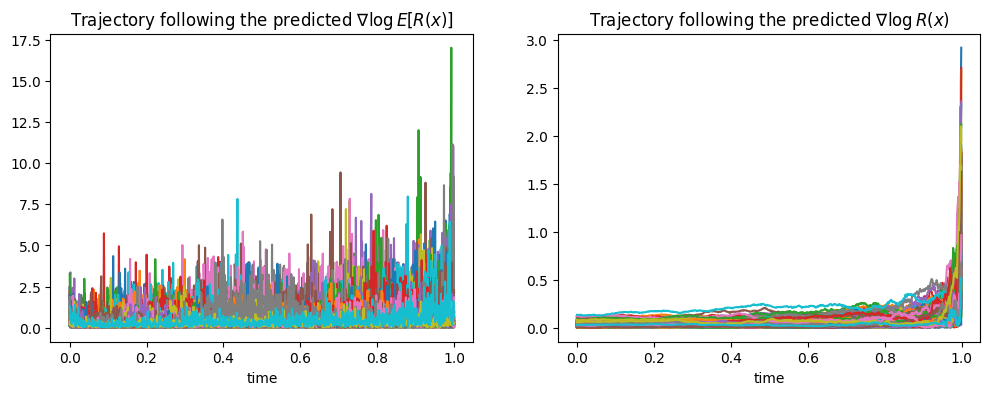

In [55]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
# predicted 
traj_pred = torch.cumsum(pred_vectors, dim=-1)
axs[0].plot(torch.linspace(1, 0, 1000), torch.linalg.norm(traj_pred[:,:200], dim=-1).cpu())
axs[0].set_xlabel("time")
axs[0].set_title(r"Trajectory following the predicted $\nabla \log E[R(x)]$")


# true
traj_true = torch.cumsum(true_vectors, dim=-1)
axs[1].plot(torch.arange(0, 1, 0.001), torch.linalg.norm(traj_true[:,:200], dim=-1).cpu())
axs[1].set_xlabel("time")
axs[1].set_title(r"Trajectory following the predicted $\nabla \log R(x)$")

plt.show()

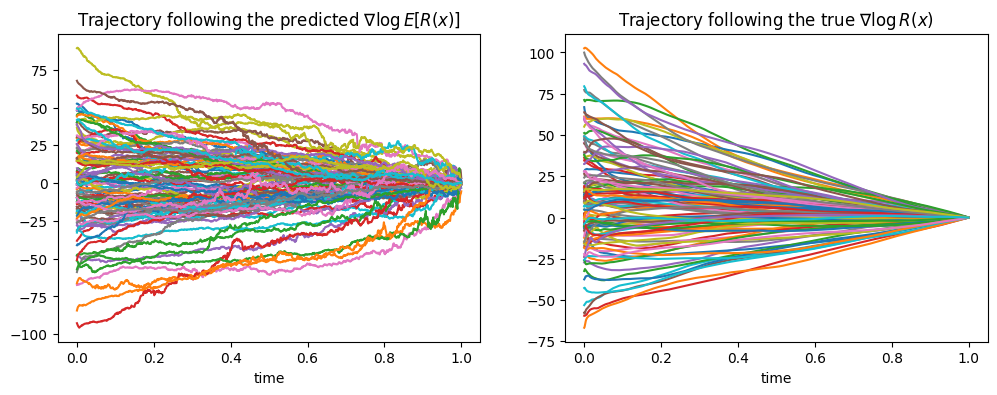

In [54]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# predicted 
# plt.plot(torch.arange(0, 1, 0.001), torch.cumsum(traj_norm_pred, dim=0).cpu())
axs[0].plot(torch.linspace(1, 0, 1000), torch.cumsum(pred_vectors[:, :100, 0], dim=0).cpu())
axs[0].set_xlabel("time")
axs[0].set_title(r"Trajectory following the predicted $\nabla \log E[R(x)]$")


# true
# plt.plot(torch.arange(0, 1, 0.001), torch.cumsum(traj_norm_true, dim=0).cpu())
axs[1].plot(torch.linspace(1, 0, 1000), torch.cumsum(true_vectors[:, :100, 0], dim=0).cpu())
axs[1].set_xlabel("time")
axs[1].set_title(r"Trajectory following the true $\nabla \log R(x)$")

plt.show()

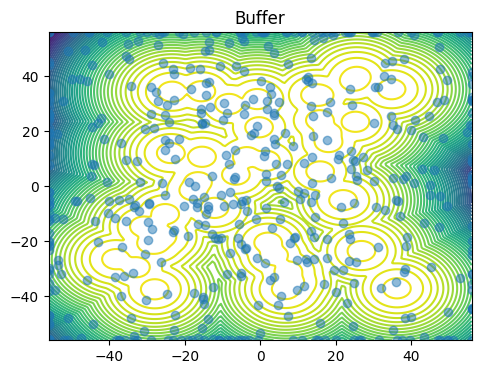

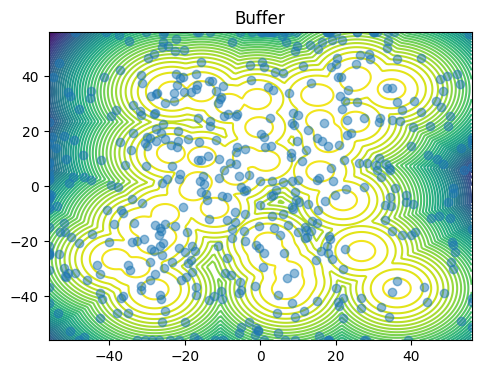

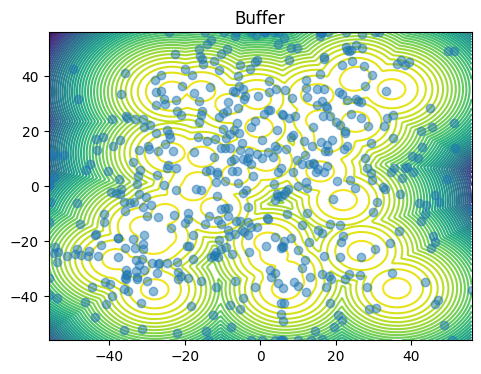

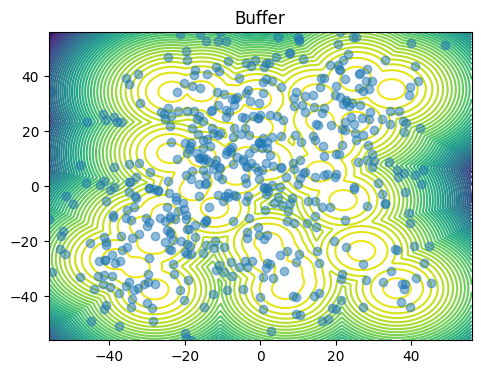

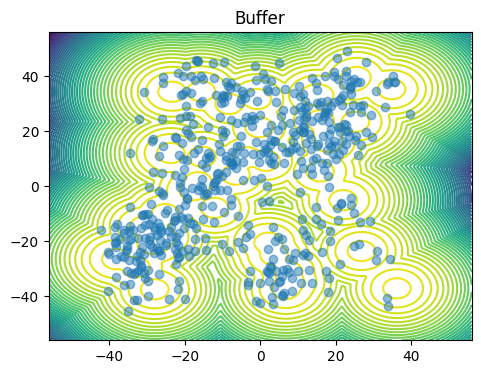

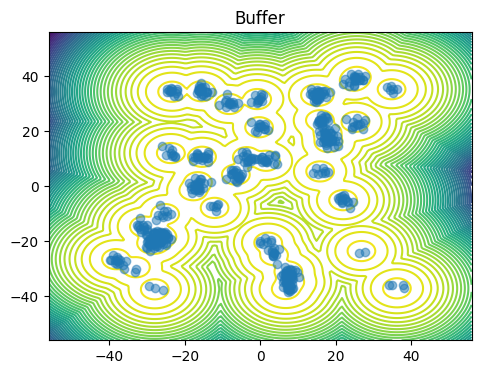

In [103]:
for i in range(0, samples.shape[0], 199):
    plot_dataset(unnormalize(samples[i], global_mins, global_maxs))

### Training Functions

In [25]:
def reward_matching_loss_biased(vectorfield, x, t, noise_schedule, weighted=False, num_mc_samples=100):     
    h_t = noise_schedule.h(t.unsqueeze(1))
    
    x.requires_grad = True

    # noisy sample: x(t)
    noisy_x = torch.normal(x, h_t ** 0.5)
    pred_scores = vectorfield(noisy_x, t)

    estimated_scores = torch.vmap(estimate_grad_Rt, in_dims=(0,0,None), randomness="different")(noisy_x, t, noise_schedule,
                                                                                                 num_mc_samples=num_mc_samples)
    norm = torch.linalg.vector_norm(estimated_scores, dim=-1)

    max_norm = 100
    clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
    estimated_scores = estimated_scores * clip_coef.unsqueeze(-1)

    err = torch.linalg.vector_norm((estimated_scores - pred_scores), dim=-1)**2

    if weighted:
        lambda_t = 1/(h_t.squeeze() + 1e-3)
        return (lambda_t * err)
    else:
        return err

In [26]:
def score_loss(vectorfield, x, t, noise_schedule, weighted=False):
    h_t = noise_schedule.h(t.unsqueeze(1))
    # x(t)
    x_t = torch.normal(x, h_t ** 0.5)
    s_pred = vectorfield(x_t, t)

    s_true = - (x_t - x)/ h_t 

    err = torch.linalg.vector_norm((s_pred - s_true), dim=-1)**2

    if weighted:
        lambda_t = 1/(h_t.squeeze() + 1e-3)
        return (lambda_t * err)
    else:
        return err

In [27]:
# class TargetScore:
#     def __init__(self, noise_schedule, annealing_schedule):
#         self.noise_schedule = noise_schedule
#         self.annealing_schedule = annealing_schedule
        
#     def get_score(self, x, t):
#         lse_score_estimate = estimate_grad_Rt(x, t, self.noise_schedule)
#         diffusion_score_estimate = estimate_score_diffusion(x, t, self.noise_schedule)
        
#         annealing_factors = self.annealing_schedule(t).unsqueeze(-1)
#         return (
#             ((1 - annealing_factors) * lse_score_estimate) + 
#             (annealing_factors * diffusion_score_estimate)
#         )
    
#     def step(self):
#         self.annealing_schedule.step()

In [28]:
class GeometricAnnealingSchedule:
    def __init__(self, min_val, max_val, max_min_val, total_num_steps):
        '''
        max_min_val is the maximum value of the minimum convex combination weight
        '''
        self.min_val = min_val
        self.max_val = max_val
        self.max_min_val = max_min_val
        
        self.curr_step = 0
        self.total_num_steps = float(total_num_steps)
        
    def __call__(self, t):
        interpolation = self.curr_step / self.total_num_steps
        
        min_val = (
            ((1 - interpolation) * self.min_val) + 
            (interpolation * self.max_min_val)
        )
        
        return min_val * ((self.max_val / self.min_val) ** t)
    
    def step(self):
        self.curr_step += 1

### Training

In [29]:
buffer = SimpleBuffer(2, 10000, 1000, initial_sampler=None, 
                      device=device, fill_buffer_during_init=False, 
                      sample_with_replacement=True, prioritize=True)
# buffer.add(init_samples, init_energy)

Buffer not initialised, expected that checkpoint will be loaded.


In [30]:
outer_epochs= 100
inner_epochs = 100

batch_size = 512

# train_dataset = TensorDataset(x1_samples_normalized.clone(), x1_energy.clone())
train_dataset = TensorDataset(init_samples.clone(), init_energy.clone())
# train_dataset = TensorDataset(true_samples.clone(), true_energy.clone())
trainloader = DataLoader(train_dataset, batch_size = batch_size, shuffle=True) 

In [31]:
def lambdaa(t):
    return t

In [32]:
if normalize_data:
    beta = torch.tensor(0.2)

    sigma_min = sqrt(0.01)
    sigma_max = sqrt(0.6)
else:
    beta = torch.tensor(1000)

    sigma_min = sqrt(0.01)
    sigma_max = sqrt(1000)

noise_schedule = LinearNoiseSchedule(beta)
# noise_schedule = GeometricNoiseSchedule(sigma_min, sigma_max)

weighted = True
vectorfield = MyMLP().to(device)
opt_vectorfield = Adam(vectorfield.parameters(), lr=1e-3)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0 | Loss 32325.087891
Epoch 49 | Loss 27749.470703
Epoch 98 | Loss 15702.833008


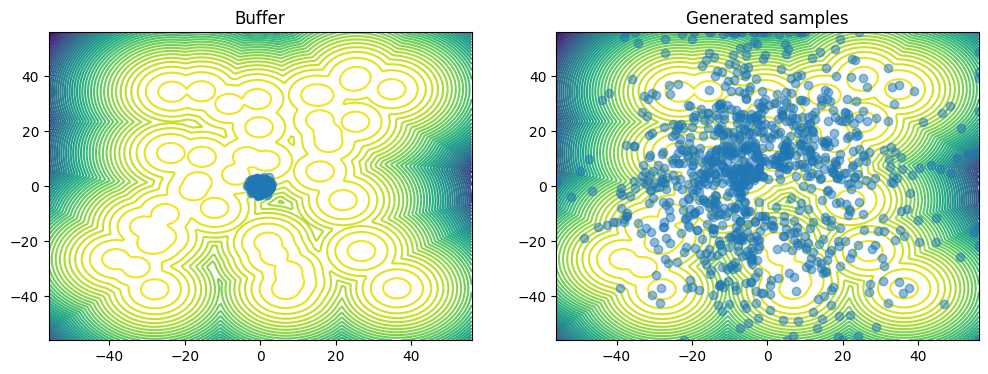

  1%|          | 1/100 [00:11<19:24, 11.76s/it]

Epoch 0 | Loss 5664.555176
Epoch 49 | Loss 7996.760742
Epoch 98 | Loss 8820.451172


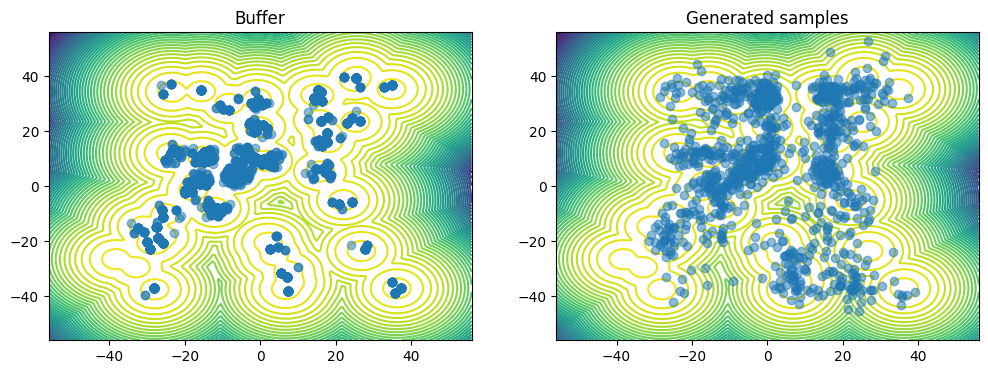

  2%|▏         | 2/100 [00:36<31:44, 19.44s/it]

Epoch 0 | Loss 8286.475586
Epoch 49 | Loss 12222.572266
Epoch 98 | Loss 5681.031250


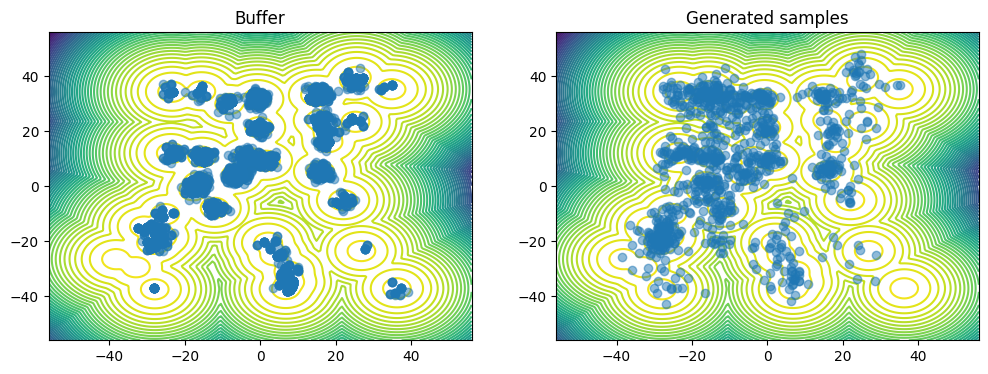

  3%|▎         | 3/100 [01:02<35:52, 22.19s/it]

Epoch 0 | Loss 6238.660156
Epoch 49 | Loss 6037.872559
Epoch 98 | Loss 5192.202148


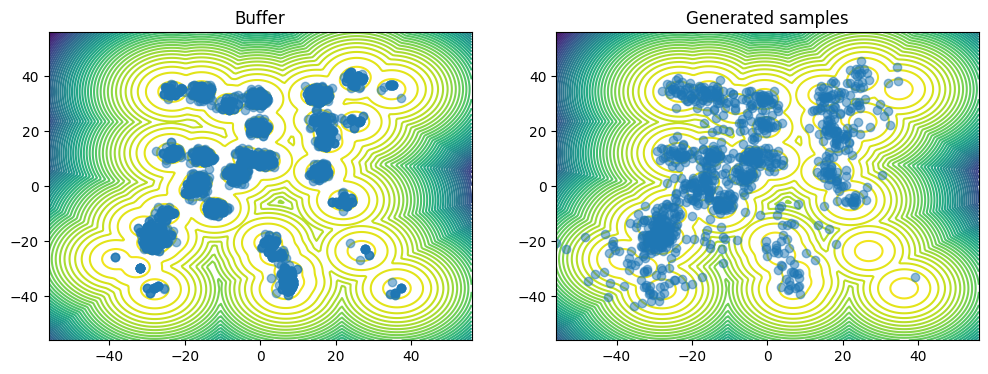

  4%|▍         | 4/100 [01:27<37:35, 23.50s/it]

Epoch 0 | Loss 3350.031982
Epoch 49 | Loss 3617.177734
Epoch 98 | Loss 5224.827148


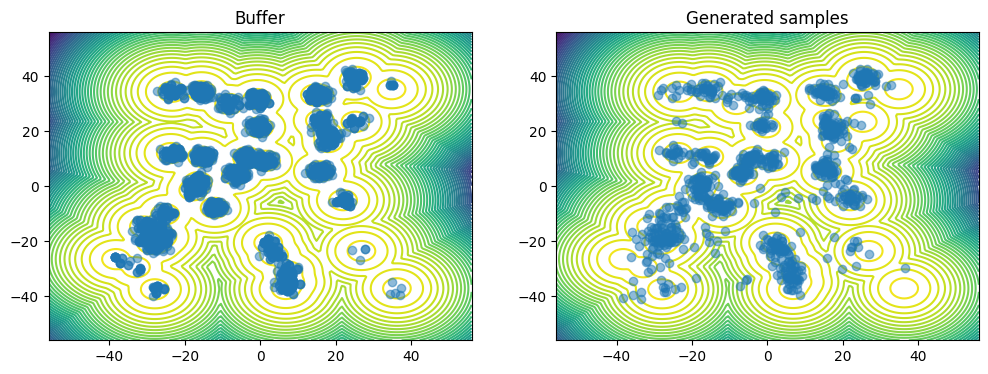

  5%|▌         | 5/100 [01:52<38:09, 24.10s/it]

Epoch 0 | Loss 6059.436035
Epoch 49 | Loss 12930.012695
Epoch 98 | Loss 4748.579590


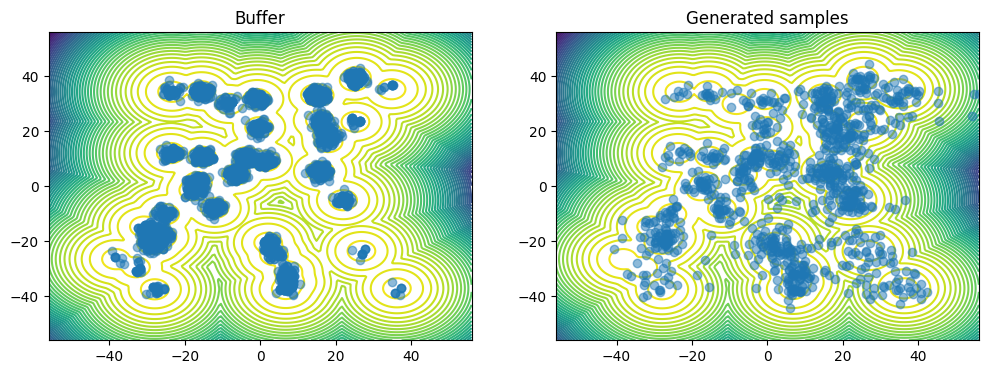

  6%|▌         | 6/100 [02:18<38:49, 24.78s/it]

Epoch 0 | Loss 6115.791992
Epoch 49 | Loss 16029.344727
Epoch 98 | Loss 4985.823242


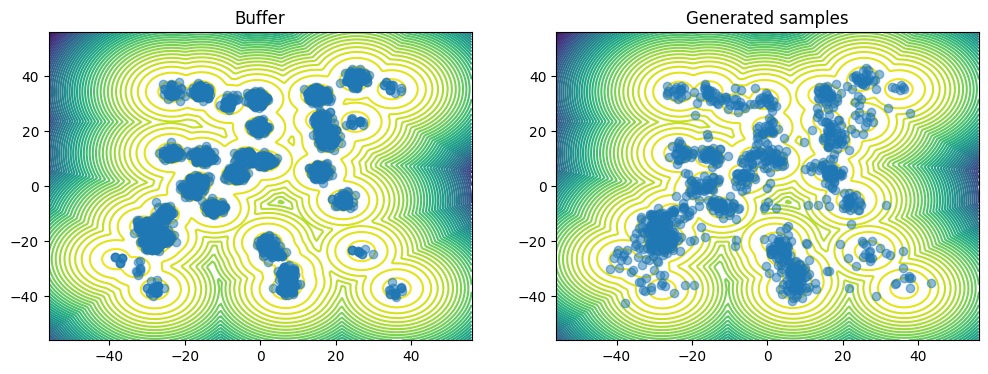

  7%|▋         | 7/100 [02:44<38:37, 24.92s/it]

Epoch 0 | Loss 5884.307129
Epoch 49 | Loss 5472.871094
Epoch 98 | Loss 6251.885742


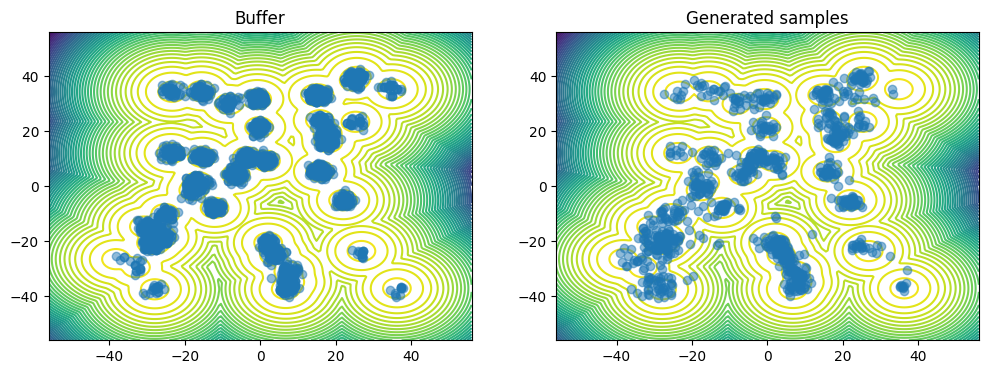

  8%|▊         | 8/100 [03:10<38:46, 25.28s/it]

Epoch 0 | Loss 7831.688477
Epoch 49 | Loss 5455.911133
Epoch 98 | Loss 3877.716309


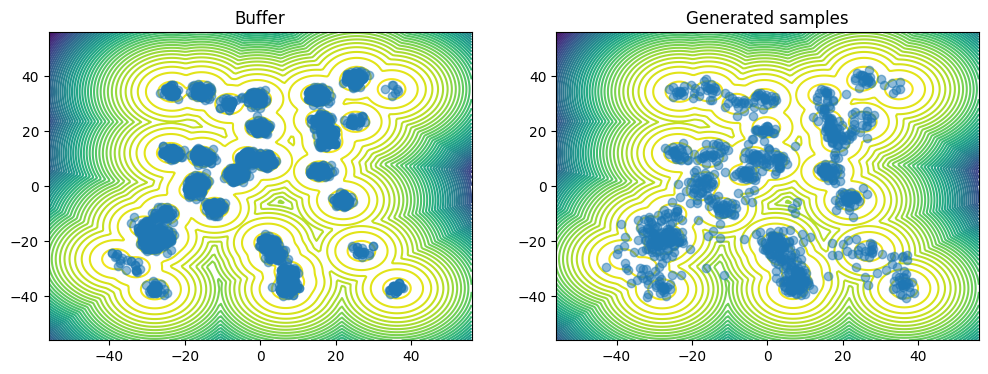

  9%|▉         | 9/100 [03:35<38:13, 25.20s/it]

Epoch 0 | Loss 4207.320312
Epoch 49 | Loss 3524.425781
Epoch 98 | Loss 5722.658203


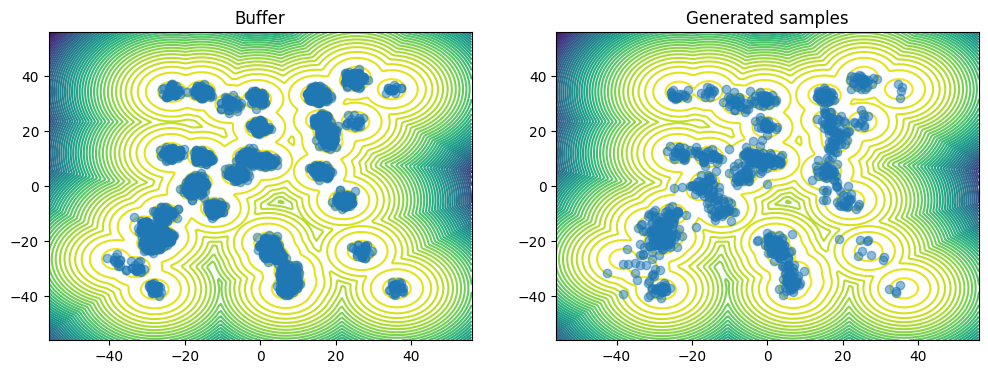

 10%|█         | 10/100 [04:00<37:49, 25.22s/it]

Epoch 0 | Loss 7426.834961
Epoch 49 | Loss 6249.833008
Epoch 98 | Loss 4513.291016


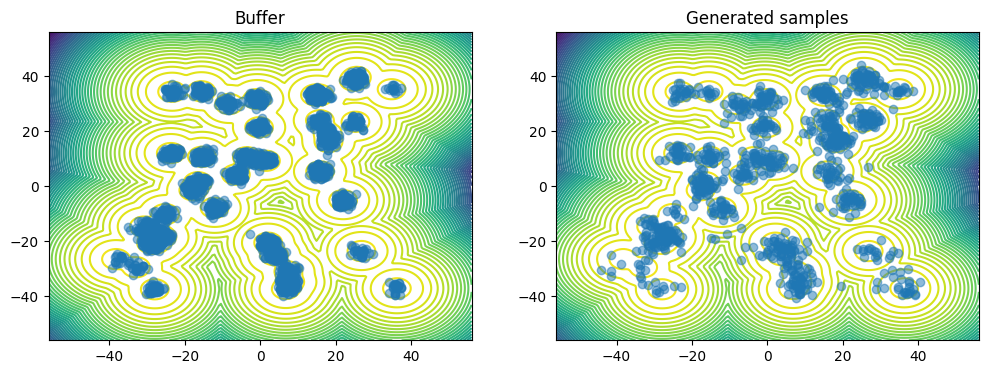

 11%|█         | 11/100 [04:25<37:34, 25.33s/it]

Epoch 0 | Loss 5313.229492
Epoch 49 | Loss 5901.192383
Epoch 98 | Loss 4974.117676


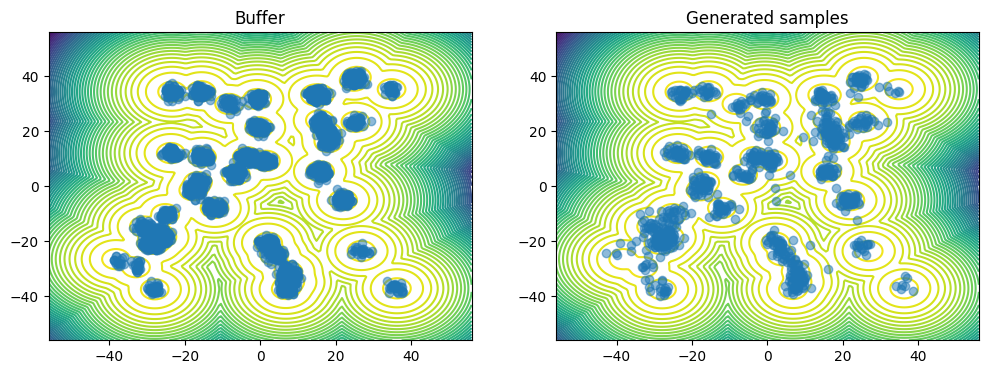

 12%|█▏        | 12/100 [04:51<37:05, 25.29s/it]

Epoch 0 | Loss 4260.845703


 12%|█▏        | 12/100 [04:53<35:50, 24.44s/it]


KeyboardInterrupt: 

In [33]:
for epoch in tqdm(range(outer_epochs)):
    for epoch in range(inner_epochs):
        total_loss = 0.
        for samples,_ in trainloader:
            samples = samples.to(device)
            opt_vectorfield.zero_grad()

            t = torch.rand(len(samples), device=device)
            num_mc_samples = 100

            rm_loss = reward_matching_loss_biased(vectorfield, samples, t, 
                                                  noise_schedule, weighted=weighted,
                                                  num_mc_samples=num_mc_samples) 
            
            
            sm_loss = score_loss(vectorfield, samples, t, noise_schedule, weighted=weighted)

            loss = ((1- lambdaa(t)) * rm_loss + lambdaa(t) * sm_loss).mean()
            total_loss += loss.item()
            loss.backward()
            opt_vectorfield.step()
        if epoch % 49 == 0:
            print("Epoch %d | Loss %f" % (epoch, loss.item()))


    # Generate samples using the network
    ve_reverse_sde = VEReverseSDE(vectorfield, noise_schedule)
    x1_samples = (torch.randn((1000, dim), device=device) * np.sqrt(noise_schedule.h(1))).to(device)
    samples, _ = integrate_sde(ve_reverse_sde, x1_samples, [0, 1], 0.001)
    samples = samples[-1]
    samples_energy = target.log_prob(unnormalize(samples, global_mins, global_maxs)).detach()

    # Update Buffer 
    buffer.add(samples, samples_energy)

    plot_dataset(unnormalize(train_dataset.tensors[0], global_mins, global_maxs), 
                 unnormalize(samples, global_mins, global_maxs))
    plt.show()
    # Resample data from the buffer
    samples, samples_energy, _ = buffer.sample(512 * 10)
    train_dataset = TensorDataset(samples, samples_energy)
    trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True)

### Evaluation

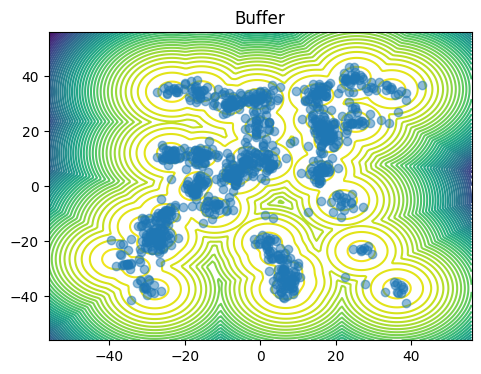

[<Figure size 1200x400 with 1 Axes>]

In [34]:
samples,_ = integrate_sde(ve_reverse_sde, x1_samples, [0, 1], 0.001)
samples = samples[-1]
plot_dataset(unnormalize(samples, global_mins, global_maxs))

In [35]:
from torch.func import jacrev

In [36]:
mode = "follow_model"

In [37]:
# from math import sqrt
# if normalize_data:
#     sigma_max = sqrt(0.4)
#     sigma_min = sqrt(0.01)
# else:
#     sigma_max = sqrt(500)
#     sigma_min = 0.01

# noise_schedule = GeometricNoiseSchedule(sigma_min, sigma_max)

# if normalize_data:
#     beta = torch.tensor(0.2)
# else:
#     beta = torch.tensor(1000)

# noise_schedule = LinearNoiseSchedule(beta)

In [38]:
def drift(x, t, mode="follow_estimate"):
    with torch.enable_grad():
        x.requires_grad = True

        if mode == "follow_estimate":
            f = -0.5 * noise_schedule.g(t)**2 * estimate_grad_Rt(x, t, noise_schedule, num_mc_samples=100)
            # f = clip(f, max_norm=200) #2

        elif mode == "follow_true":
            f = - 0.5 * noise_schedule.g(t)**2 * true_grad_Rt(x, t, noise_schedule)

        elif mode == "follow_model":
            f = - 0.5 * noise_schedule.g(t[0])**2 * vectorfield(x, t)
            # f = clip(f, max_norm=2)
    return f

In [39]:
def div_fn(u, mode="follow_estimate"):
    """Accepts a function u:R^D -> R^D."""
    J = jacrev(u)
    if mode=="follow_model":
        def div(x):
            return torch.trace(J(x.unsqueeze(0)).squeeze())
        return div
    else: 
        J = jacrev(u)
        return lambda x: torch.trace(J(x))

def output_and_div(vecfield, x, mode="follow_estimate"):
    if mode == "follow_estimate":
        dx = torch.vmap(vecfield, randomness="different")(x)
        div = torch.vmap(div_fn(vecfield, mode=mode), randomness="different")(x)
    elif mode == "follow_true":
        dx = vecfield(x)
        div = torch.vmap(div_fn(vecfield, mode=mode), randomness="different")(x.clone().detach().requires_grad_(True))
    elif mode == "follow_model":
        dx = vecfield(x)
        div = torch.vmap(div_fn(vecfield, mode=mode), randomness="different")(x)
    return dx, div

In [40]:
def prior_dist(beta):
    dist = torch.distributions.MultivariateNormal(
        torch.zeros(2).to(device), torch.eye(2).to(device) * beta
    )
    return dist

In [41]:
reverse_time = False

In [42]:
def odefunc(t, x_in):
    x = x_in[..., :-1].clone().detach().requires_grad_(True)
    t = t.to(device)
    
    # if t>0.9:
    #     mode = "follow_true"
    # else:
    #     mode  = "follow_estimate"
        
    vecfield = lambda x: drift(x, t, mode=mode)
    
    if mode == "follow_model":
        def vecfield(x):
            return drift(x, torch.ones(x.shape[0]).to(device) * t, mode=mode)
    dx, div = output_and_div(vecfield, x, mode=mode)
    div = div.reshape(-1, 1)
    return torch.cat([dx, div], dim=-1)

with torch.no_grad():
    if reverse_time:
        x1 = torch.randn(1024, 2).to(device) * np.sqrt(beta)
        time = torch.linspace(1, 0, 1000).to(device)
    else:
        if normalize_data:
            x1 = true_samples
        else:
            x1 = unnorm_true_samples
        time = torch.linspace(0, 1, 1000).to(device)
    state1 = torch.cat([x1, torch.zeros_like(x1[..., :1])], dim=-1)
    state1.requires_grad = True
    state0 = odeint(odefunc, state1, t=time, method="euler")[-1]

    x0, logdetjac = state0[..., :-1], state0[..., -1]
    if normalize_data:
        x0 = unnormalize(x0, -50, 50)
        p0 = prior_dist(beta * 50**2)
    else:
        p0 = prior_dist(beta)
    logp0 = p0.log_prob(x0)
    logp1 = -(logp0 + logdetjac)

In [43]:
x0_screened = x0[(x0.abs() < 50).any(-1)]
logdetjac_screened = logdetjac[(x0.abs() < 50).any(-1)]
logdetjac_screened.mean()

tensor(2.4552, device='cuda:0')

In [201]:
# p0 = prior_dist(beta * 50 **2)
# logp0 = p0.log_prob(x0_screened)
# logp1 = -(logp0 + logdetjac_screened)

In [44]:
print("logp0", logp0.mean())
print("logdetjac", logdetjac.mean())
print("logp1", logp1.mean())

logp0 tensor(-10.8518, device='cuda:0')
logdetjac tensor(2.5229, device='cuda:0')
logp1 tensor(8.3289, device='cuda:0')


In [45]:
prior_samples = p0.sample((1024,)).to(device)

log_p0_true_1 = true_Rt(normalize(prior_samples), torch.tensor(1).to(device), noise_schedule)
log_p0_true = p0.log_prob(prior_samples)
print("logp0 true Rt: ", log_p0_true_1.mean())
print("logp0 true: ", log_p0_true.mean())

logp0 true Rt:  tensor(-9.2866, device='cuda:0')
logp0 true:  tensor(-9.0131, device='cuda:0')


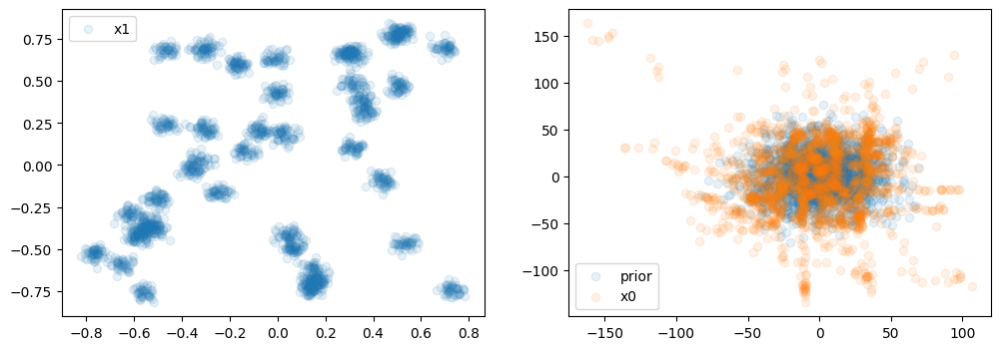

In [46]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].scatter(x1[:,0].detach().cpu(), x1[:, 1].detach().cpu(), alpha=0.1, label="x1")

prior_samples = p0.sample((2048,))
if reverse_time:
    ax[0].scatter(prior_samples[:, 0].detach().cpu(), prior_samples[:, 1].detach().cpu(), alpha=0.2, label="prior")
    ax[1].scatter(samples[:, 0].detach().cpu(), samples[:, 1].detach().cpu(), alpha=0.1, label="generated samples")
else:
    ax[1].scatter(prior_samples[:, 0].detach().cpu(), prior_samples[:, 1].detach().cpu(), alpha=0.1, label="prior")
ax[0].legend()

ax[1].scatter(x0[:, 0].detach().cpu(), x0[:, 1].detach().cpu(), alpha=0.1, label="x0")
ax[1].legend()
# plt.xlim(-100, 100)
# plt.ylim(-100, 100)
# plt.xlim(-2, 2)
# plt.ylim(-2, 2)
plt.show()